# <font color='purple'>dNLS Preprocessing QC statistics </font> 
### October 2024

In [2]:
import os
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps'
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps'
LOGS_PATH = os.path.join(NOVA_DATA_HOME, "outputs/preprocessing/spd/logs/dNLS")
PLOT_PATH = os.path.join(NOVA_HOME, 'src', 'preprocessing', 'notebooks','figures','dNLS')
os.chdir(NOVA_HOME)
import pandas as pd
import numpy as np
# plt.rcParams["image.cmap"] = "Set1"
import contextlib
import io
from IPython.display import display, Javascript

from tools.preprocessing_tools.qc_reports.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new
                                                
from tools.preprocessing_tools.qc_reports.qc_config import dnls_panels, dnls_markers, dnls_marker_info, dnls_cell_lines, \
                                                dnls_cell_lines_to_cond, dnls_cell_lines_for_disp, reps, \
                                                dnls_line_colors, dnls_lines_order, dnls_custom_palette, \
                                                dnls_expected_dapi_raw, markers, custom_palette

%load_ext autoreload
%autoreload 2

In [4]:
# choose batches
batches = [f'batch{i}' for i in range(3,6)]
batches

['batch3', 'batch4', 'batch5']

In [5]:
df = log_files_qc(LOGS_PATH, only_wt_cond=False, batches=batches)
df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']
# we need to match between the raw marker name (TDP43) and the processed marker name (TDP43N / TDP43B)
df_target.loc[df_target['marker'] == 'TDP43', 'marker'] += df_target['panel'].str.replace('panel', '')


reading logs of batch4
reading logs of batch3
reading logs of batch5

Total of 3 files were read.
Before dup handeling  (74261, 22)
After duplication removal #1: (74261, 23)
After duplication removal #2: (74261, 23)


## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

batch3
Folder structure is invalid. Missing 2 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch3/WT/panelN
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch3/TDP43/panelN
No bad files are found.
Total Sites:  25800


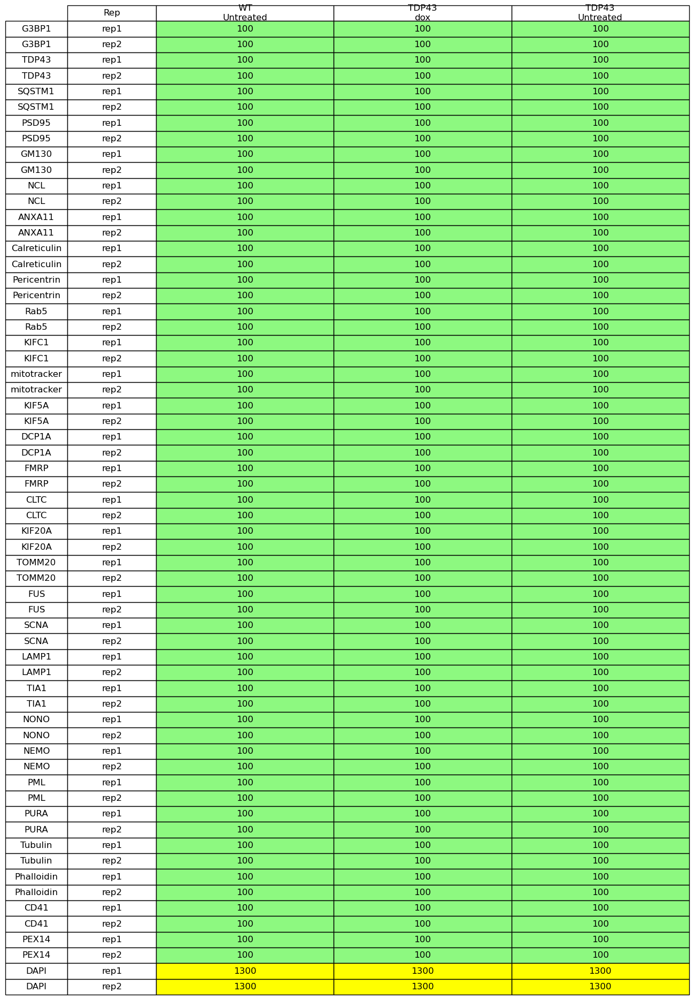

batch4
Folder structure is invalid. Missing 2 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch4/WT/panelN
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch4/TDP43/panelN
No bad files are found.
Total Sites:  25500


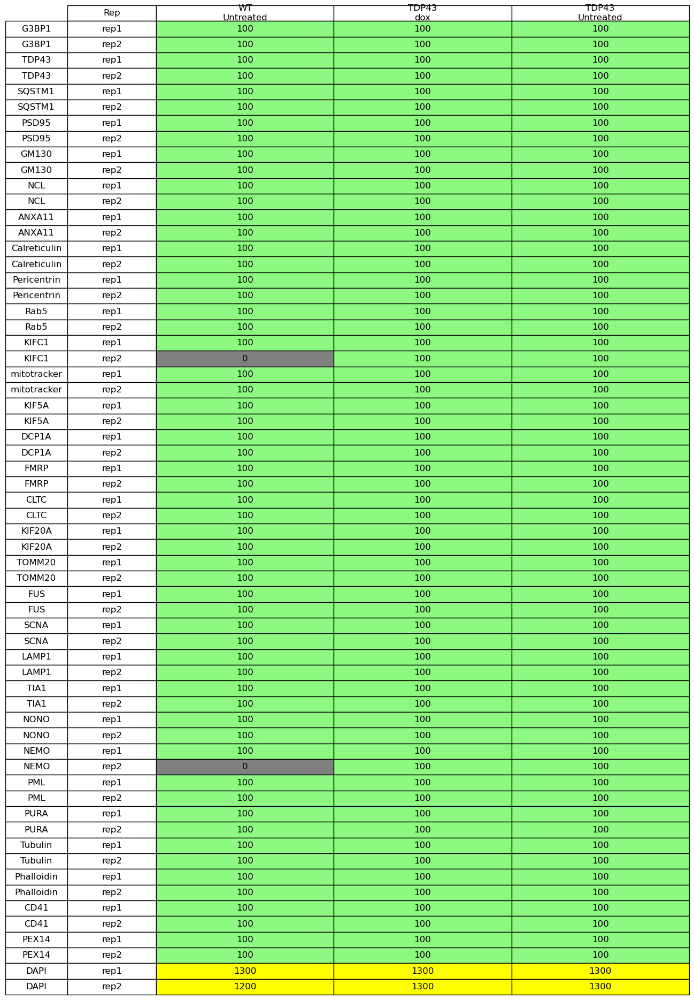

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  26897


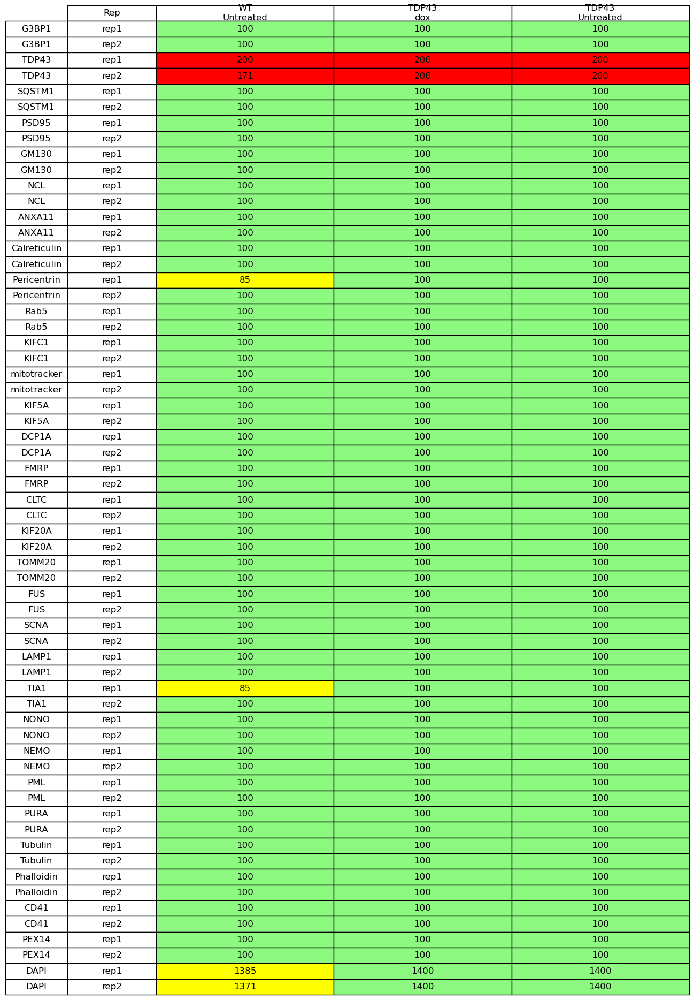

In [11]:

root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw', 'SpinningDisk','deltaNLS_sort')

raws = run_validate_folder_structure(root_directory_raw, False, dnls_panels, dnls_markers.copy(),PLOT_PATH, dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=5)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

batch3
Folder structure is invalid. Missing 3 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/WT/Untreated/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  24336


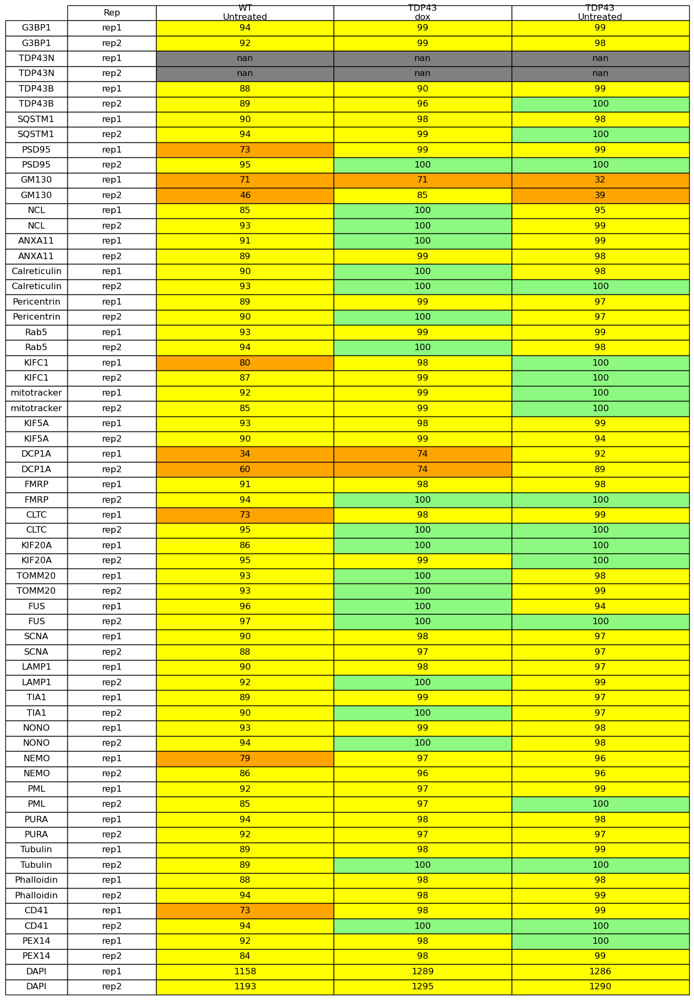

batch4
Folder structure is invalid. Missing 3 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/WT/Untreated/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  23638


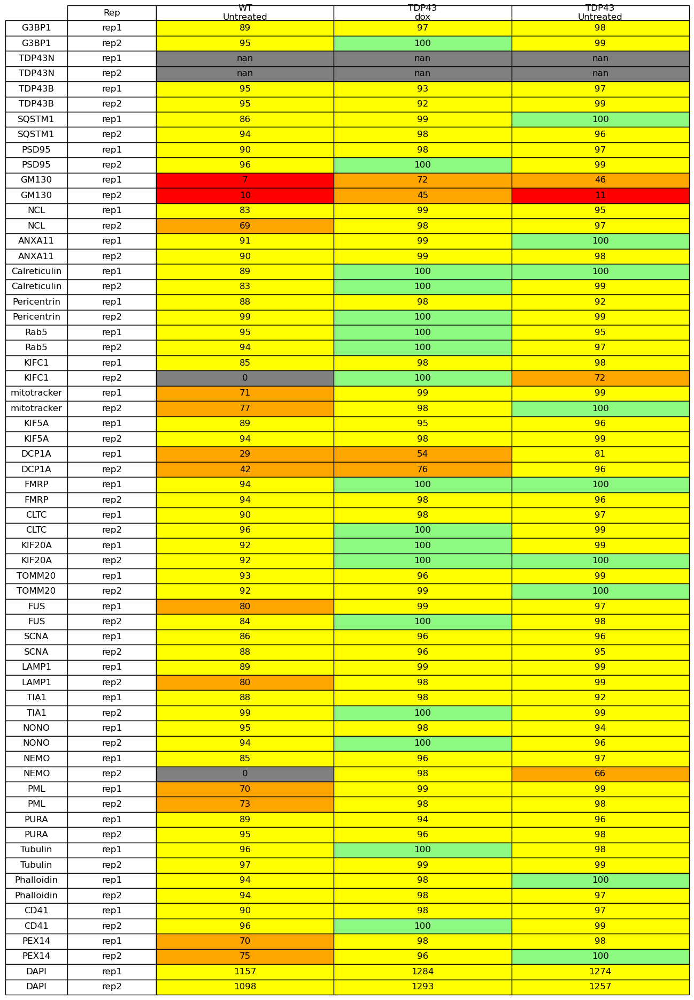

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  25527


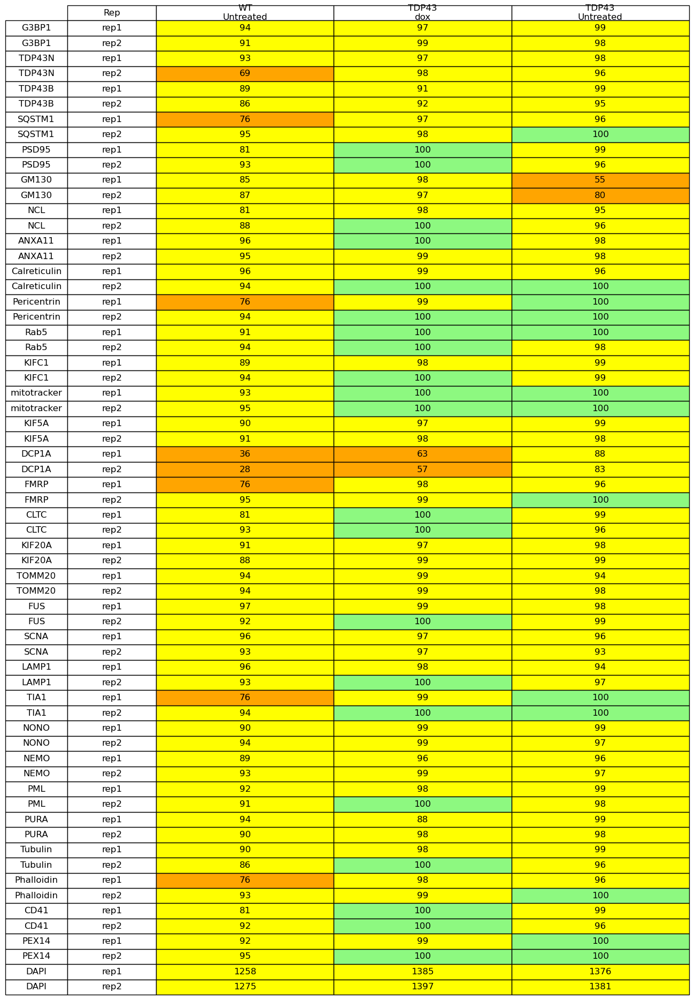

In [12]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed', 'spd2',
                              'SpinningDisk','deltaNLS')
procs = run_validate_folder_structure(root_directory_proc, True, dnls_panels, dnls_markers,PLOT_PATH,dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=5)

### Difference between Raw and Processed

batch3


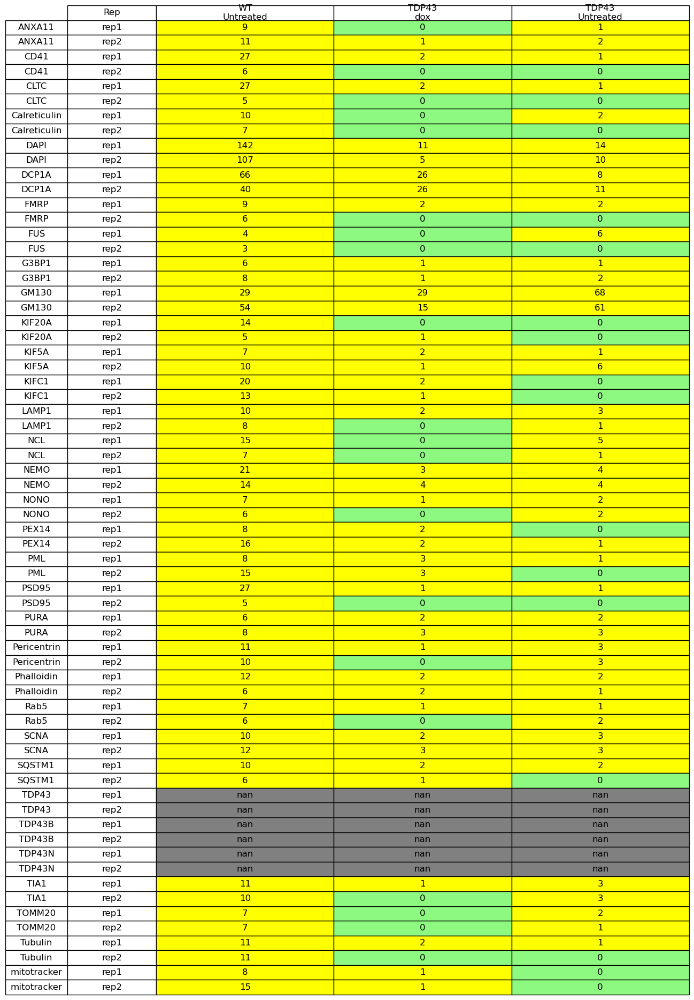

batch4


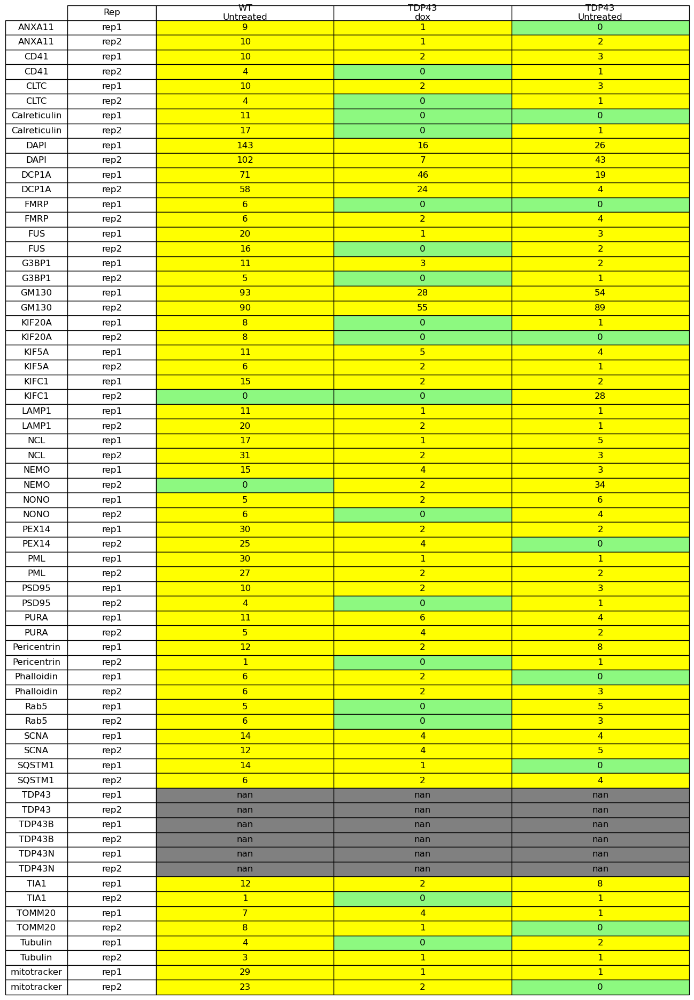

batch5


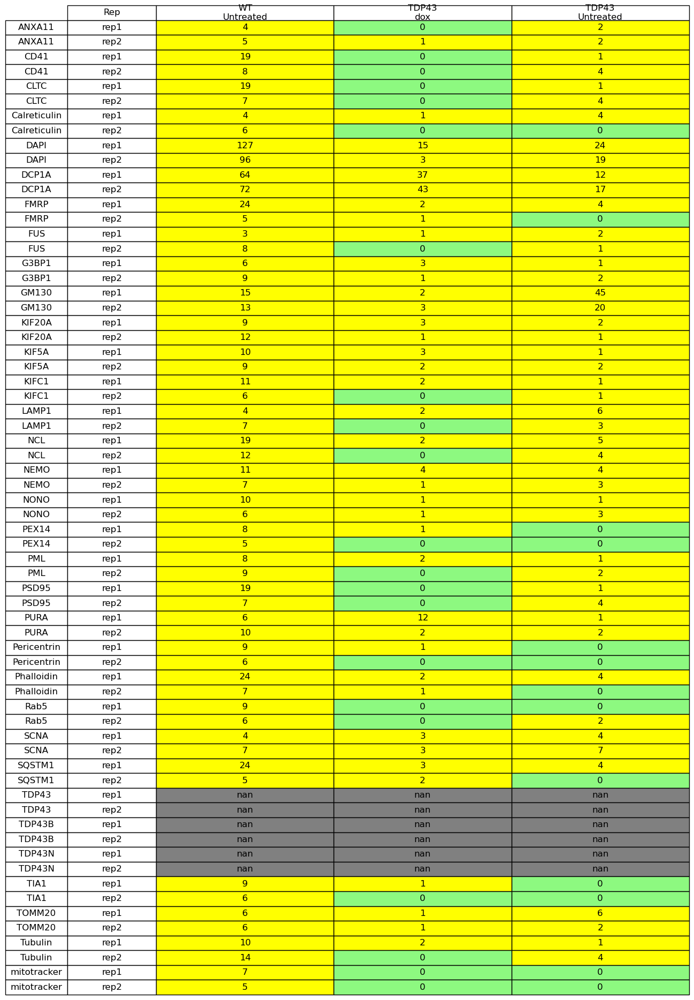

In [13]:
display_diff(batches, raws, procs, PLOT_PATH, fig_width=5)

### Variance in each batch (of processed files)

In [14]:
for batch in batches:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, cond_count=2, rep_count=len(reps), 
                                       num_markers=len(dnls_markers))
    print(f'{batch} var: ',var)

batch3 var:  0.010357440534791738
batch4 var:  0.010663615289945838
batch5 var:  0.01020901013294272


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

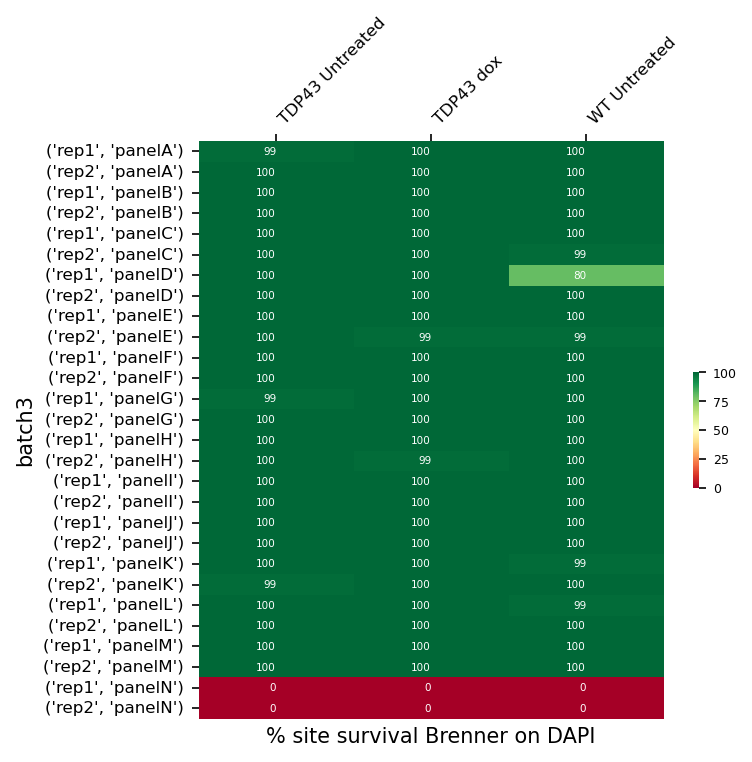

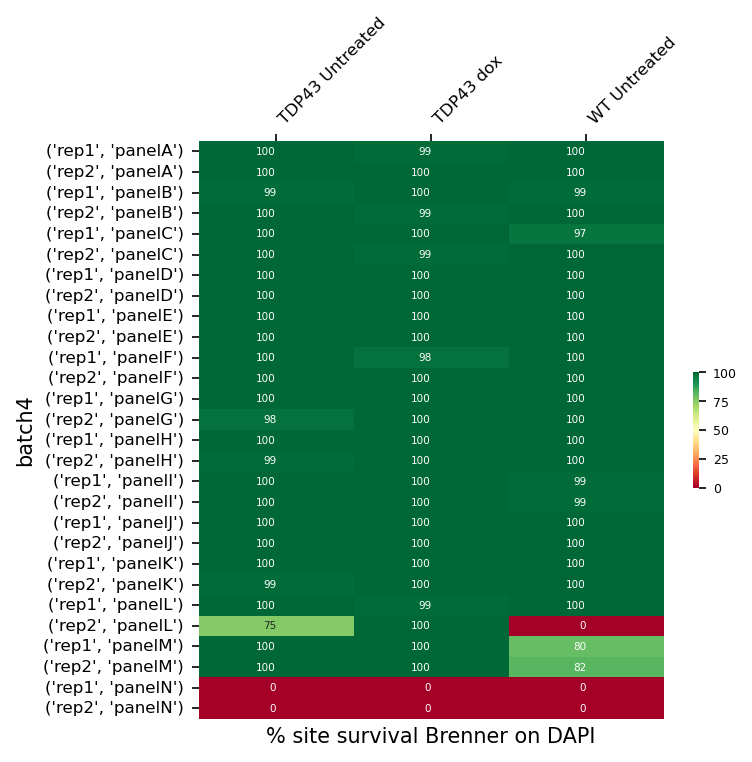

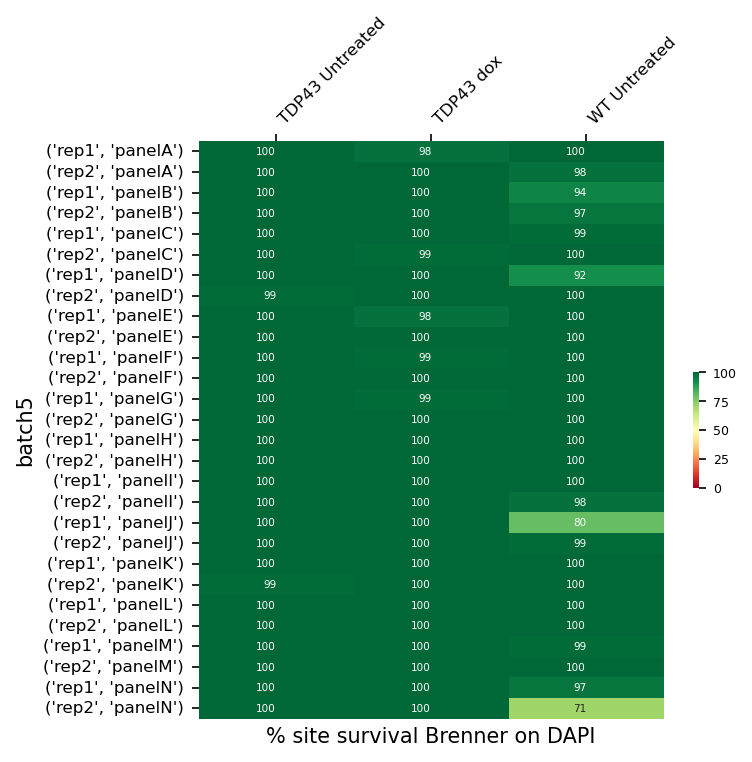

In [15]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,batches, dnls_line_colors, dnls_panels, reps)

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

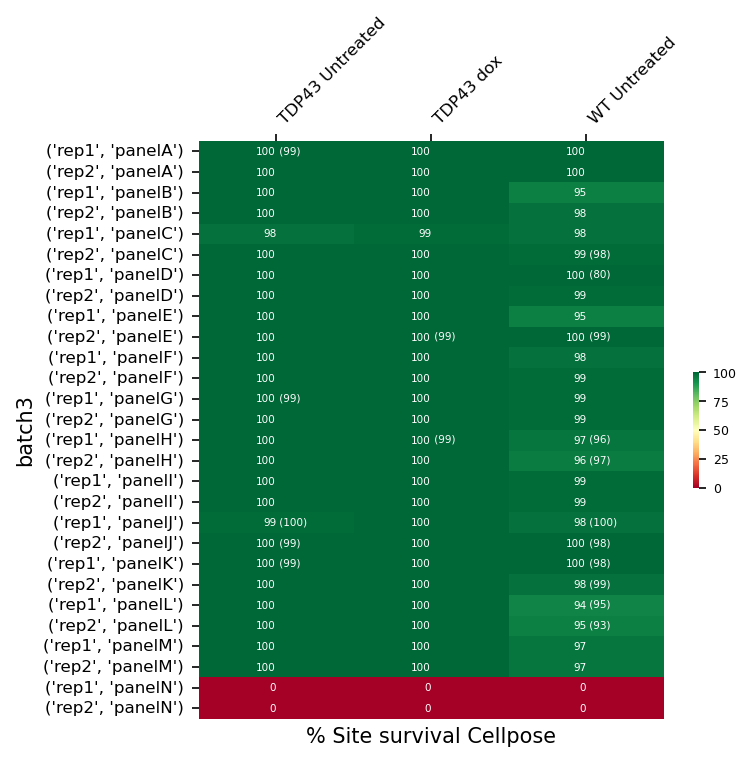

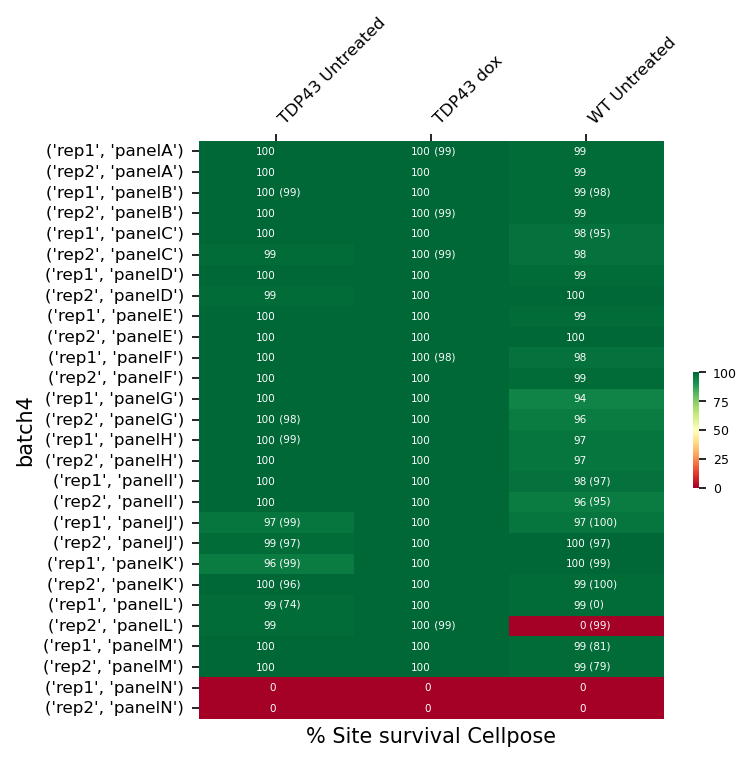

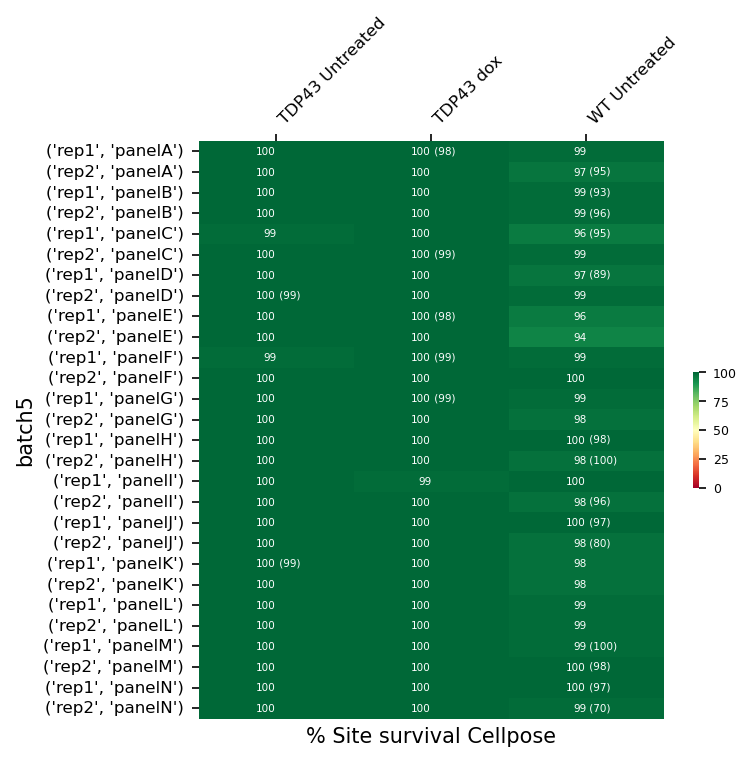

In [16]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, batches, dapi_filter_by_brenner, dnls_line_colors, dnls_panels, reps)

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least one whole cell that Cellpose detected.**

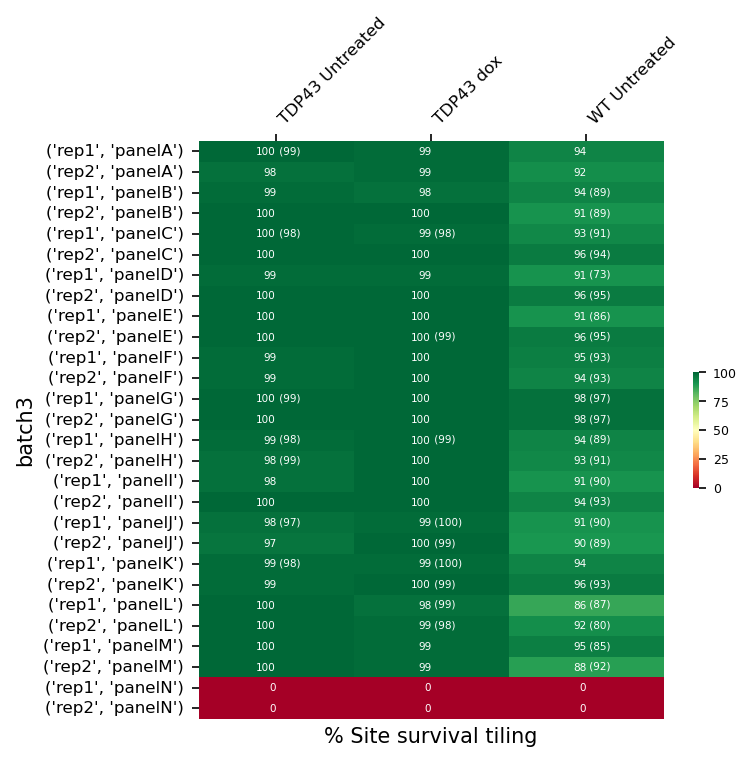

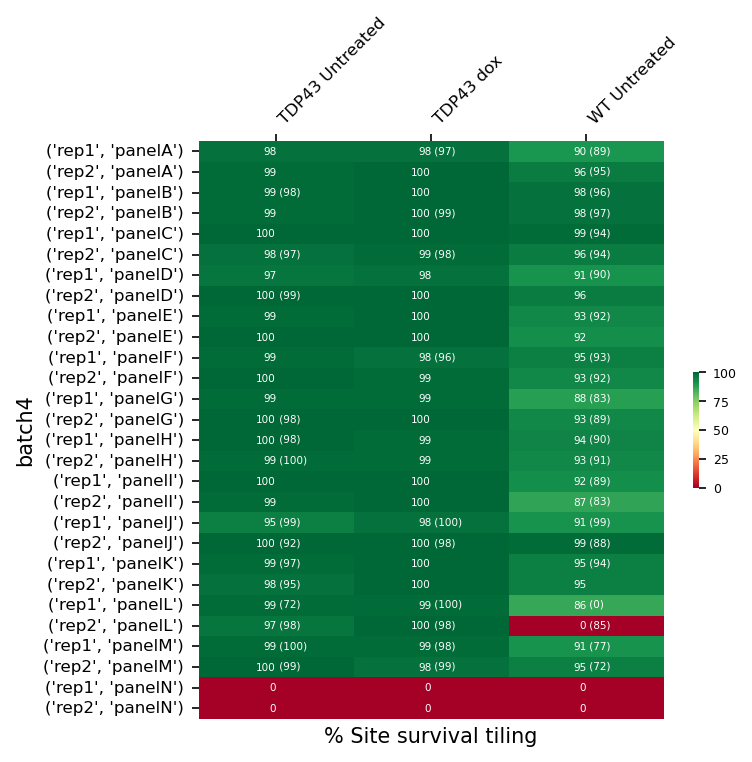

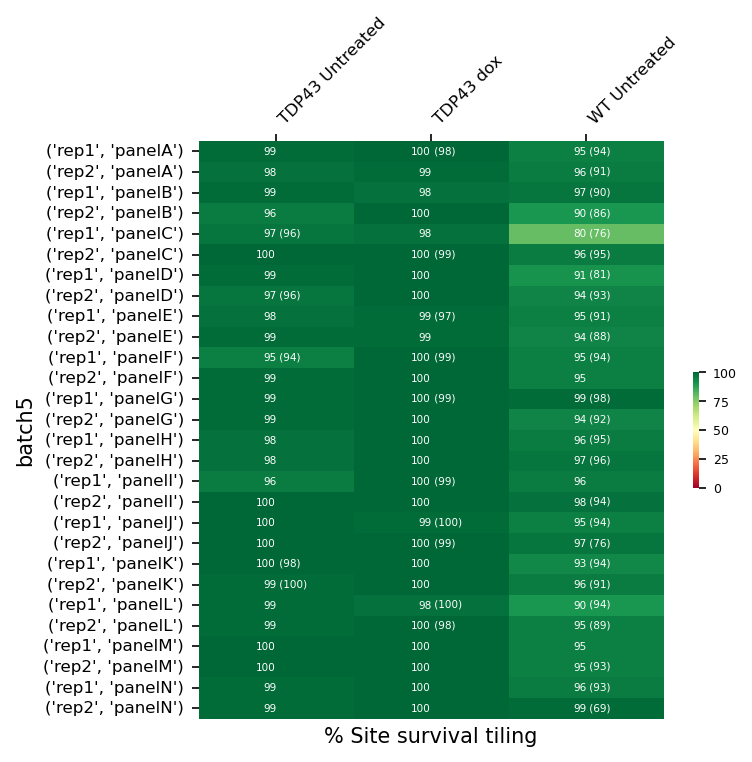

In [17]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, batches, dapi_filter_by_cellpose, dnls_line_colors, dnls_panels, reps)

### 4. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

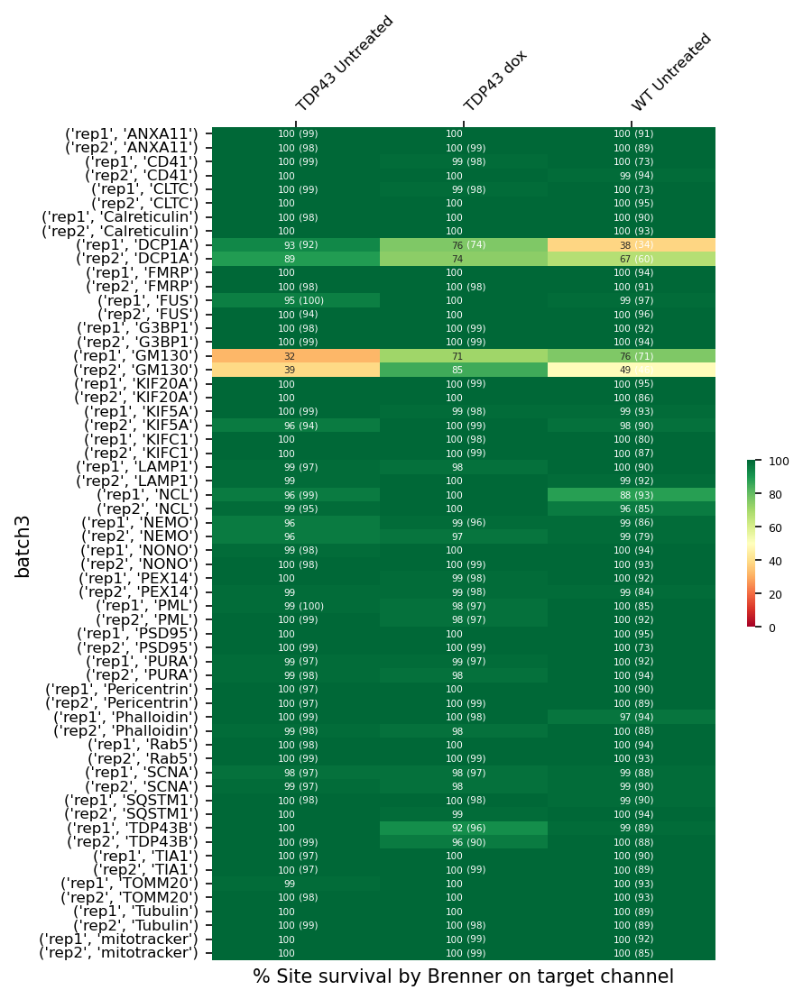

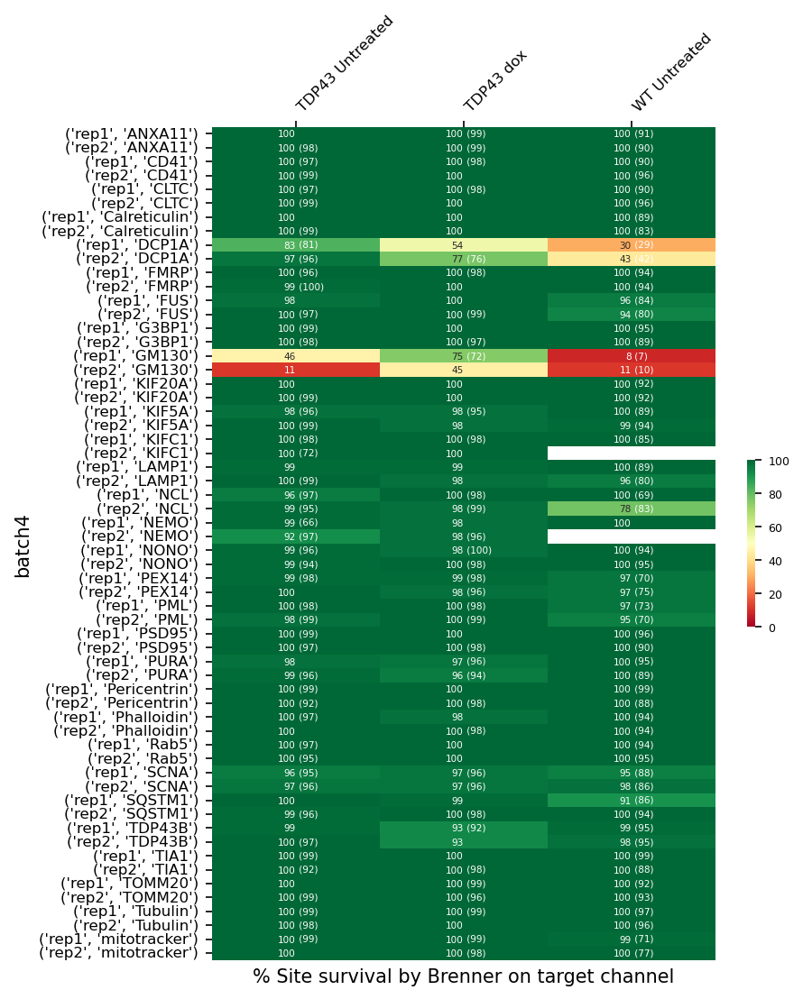

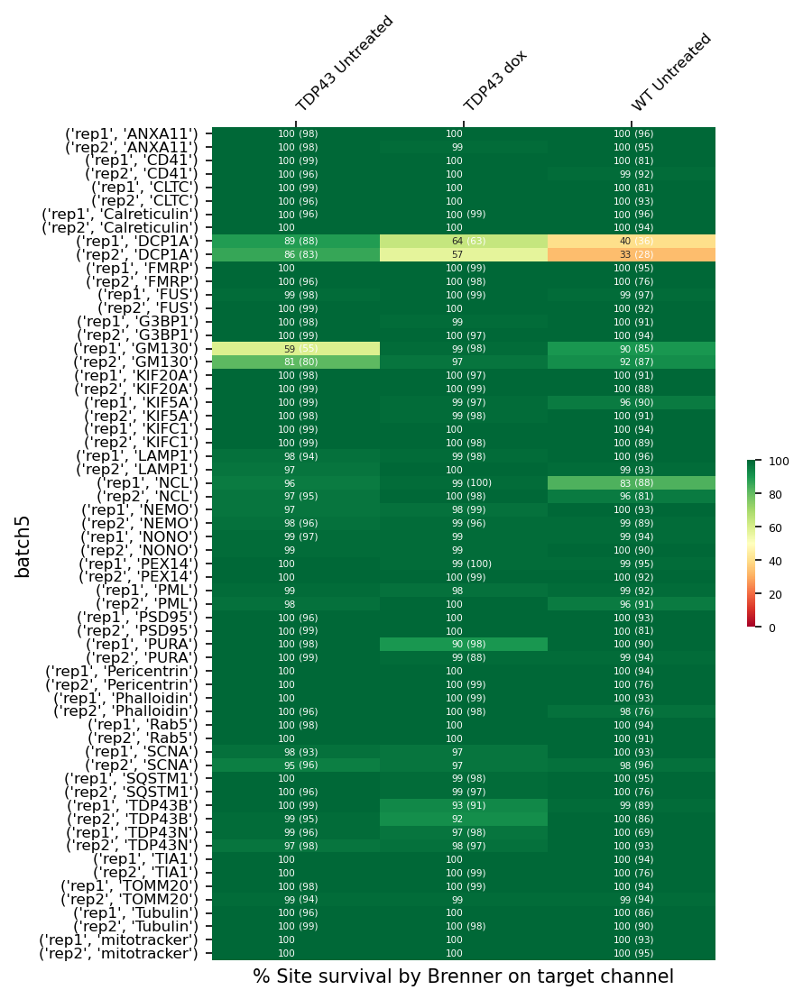

In [18]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling, dnls_markers)

## Statistics About the Processed Files

In [20]:
names = ['Total number of tiles', 'Total number of whole cells']
stats = ['n_valid_tiles','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, dnls_markers)

### Total tiles

In [31]:
markers_for_dnls = markers.copy()
markers_for_dnls.remove('TIA1')
markers_for_dnls += ['TDP43B']
total_sum[total_sum.marker.isin(markers_for_dnls)].n_valid_tiles.sum()

374956

### Total whole nuclei in tiles

In [10]:
total_sum[total_sum.marker =='DAPI'].site_whole_cells_counts_sum.sum()

152391.0

### Total nuclei in sites

In [12]:
total_sum[total_sum.marker =='DAPI'].site_cell_count.sum()

385860.0

In [25]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch3,,,,
count,258.000000,258.000000,258.000000,258.000000
mean,584.647287,5.846473,653.767442,1637.193798
std,210.678623,2.106786,245.053556,716.126394
min,123.000000,1.230000,131.000000,285.000000
25%,332.000000,3.320000,356.500000,746.750000
50%,677.500000,6.775000,774.000000,1944.000000
75%,760.000000,7.600000,857.000000,2248.000000
max,891.000000,8.910000,1006.000000,2647.000000
sum,150839.000000,NaN,168672.000000,422396.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch4,,,,
count,255.000000,255.000000,255.000000,255.000000
mean,543.862745,5.438627,603.854902,1547.223529
std,196.541216,1.965412,225.328069,674.661059
min,40.000000,0.400000,42.000000,81.000000
25%,357.000000,3.570000,399.000000,820.000000
50%,576.000000,5.760000,651.000000,1763.000000
75%,721.000000,7.210000,810.000000,2116.000000
max,887.000000,8.870000,993.000000,2613.000000
sum,138685.000000,NaN,153983.000000,394542.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch5,,,,
count,270.000000,270.000000,270.00000,270.000000
mean,557.933333,5.579333,622.92963,1564.825926
std,189.977878,1.899779,220.40687,658.346156
min,105.000000,1.050000,114.00000,249.000000
25%,366.750000,3.667500,396.00000,819.750000
50%,603.000000,6.030000,687.00000,1756.500000
75%,731.500000,7.315000,828.50000,2142.000000
max,892.000000,8.920000,1013.00000,2540.000000
sum,150642.000000,NaN,168191.00000,422503.000000


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,783.000000,783.000000,783.000000,7.830000e+02
mean,562.153257,5.621533,626.878672,1.582939e+03
std,199.577538,1.995775,230.985788,6.833561e+02
min,40.000000,0.400000,42.000000,8.100000e+01
25%,353.000000,3.530000,377.000000,7.900000e+02
50%,619.000000,6.190000,701.000000,1.819000e+03
75%,733.500000,7.335000,825.000000,2.159000e+03
max,892.000000,8.920000,1013.000000,2.647000e+03
sum,440166.000000,NaN,490846.000000,1.239441e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

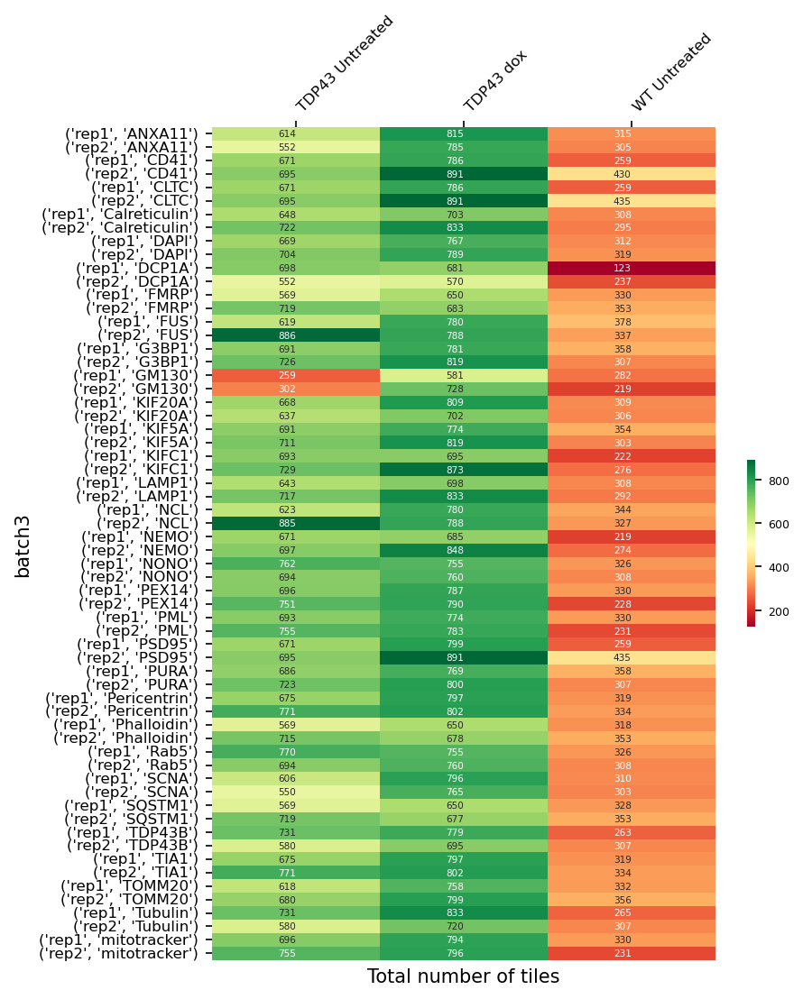

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


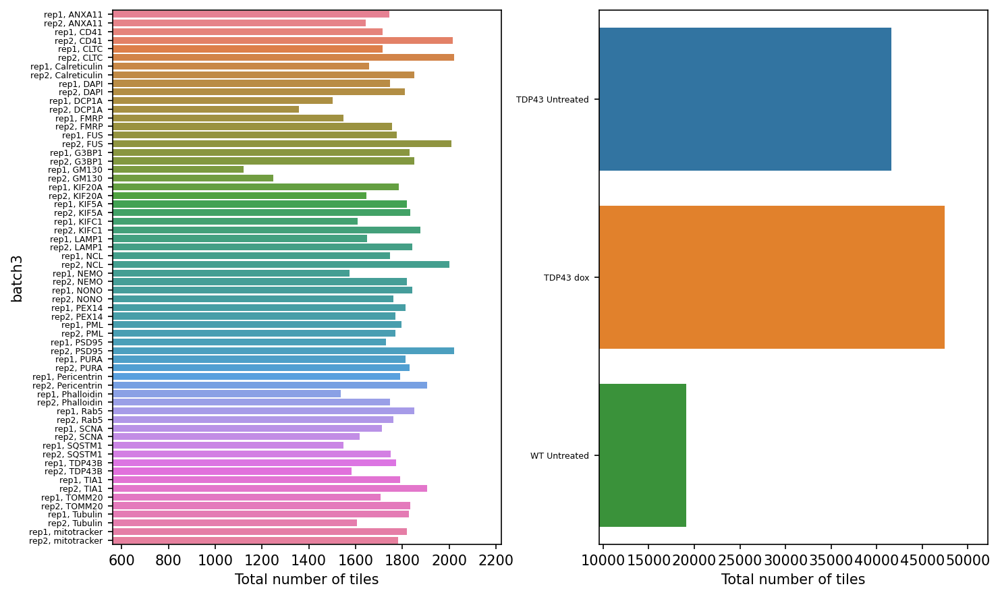

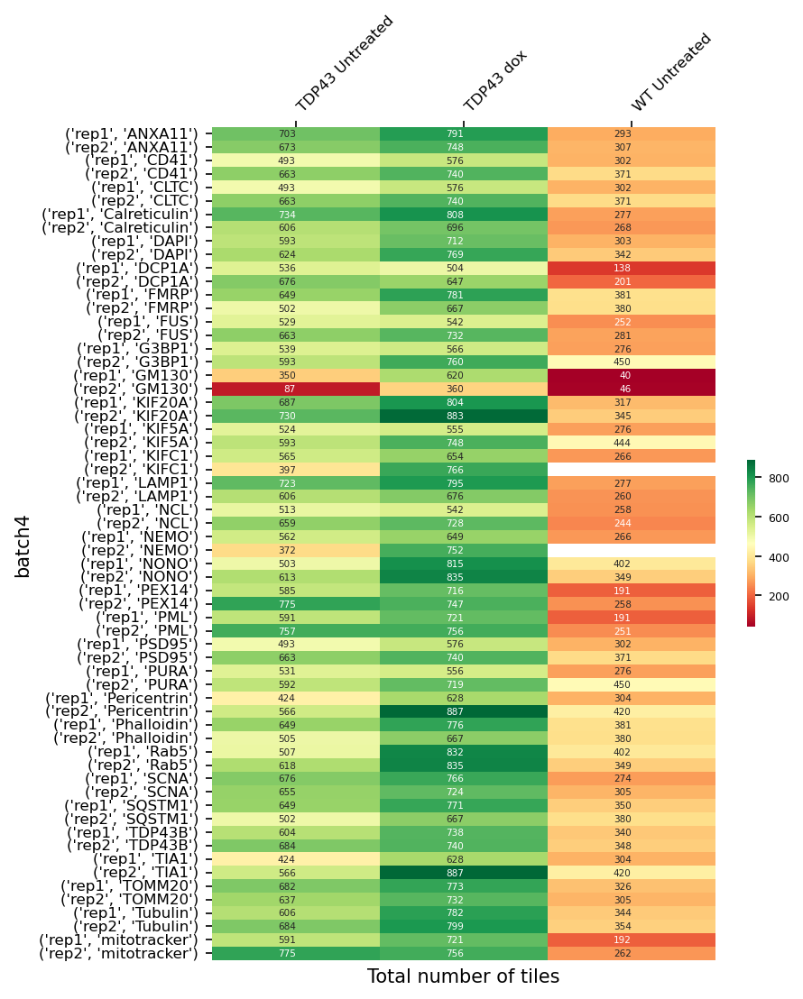

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


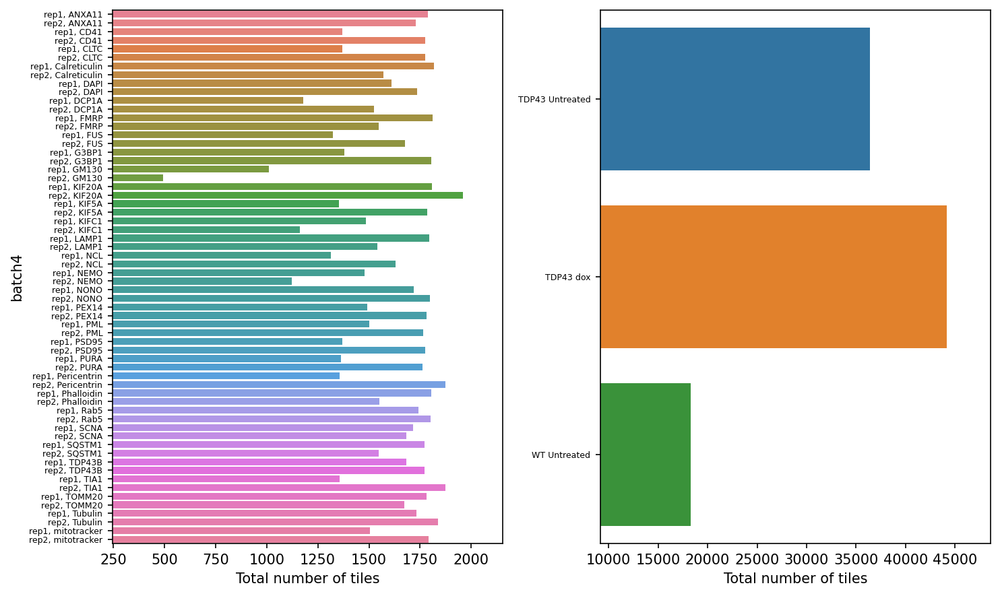

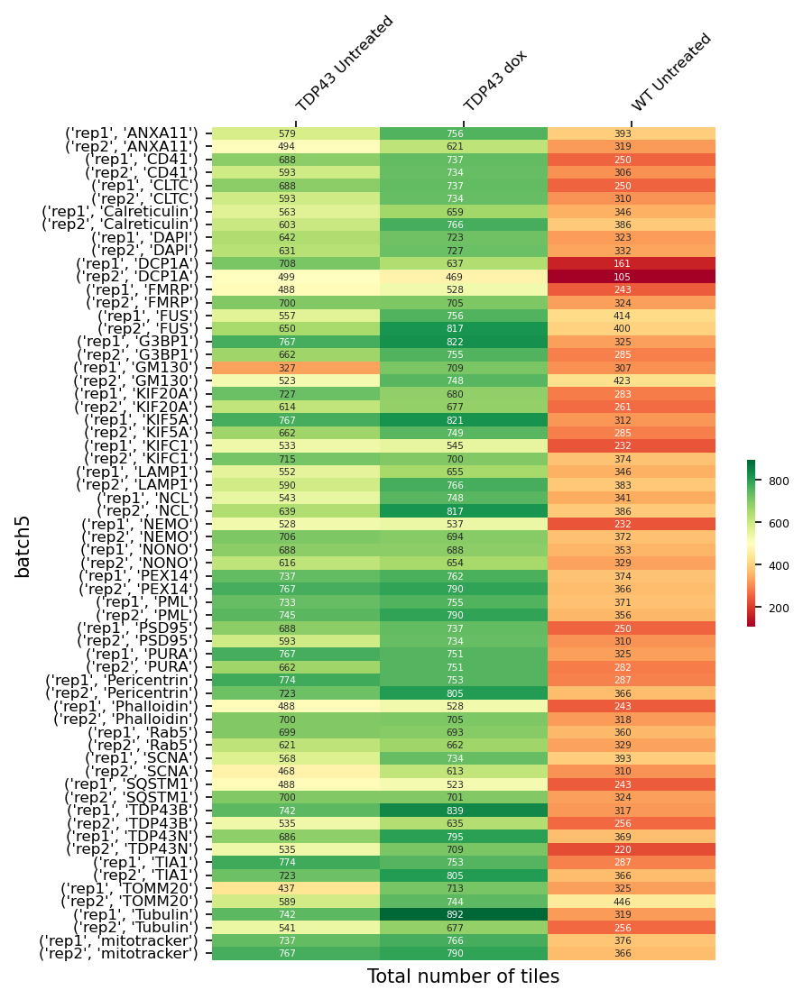

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


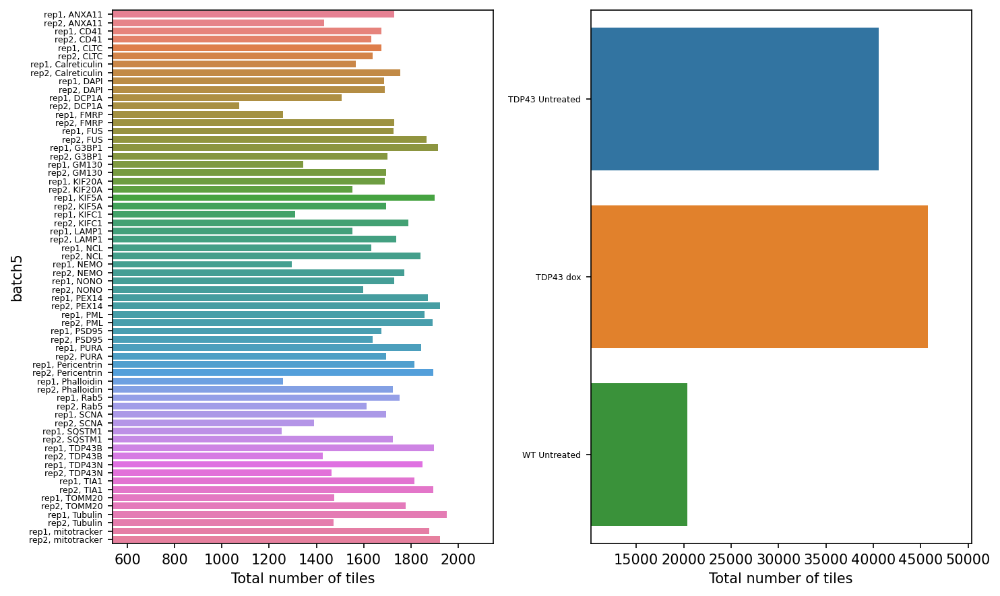

In [26]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(6,8))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

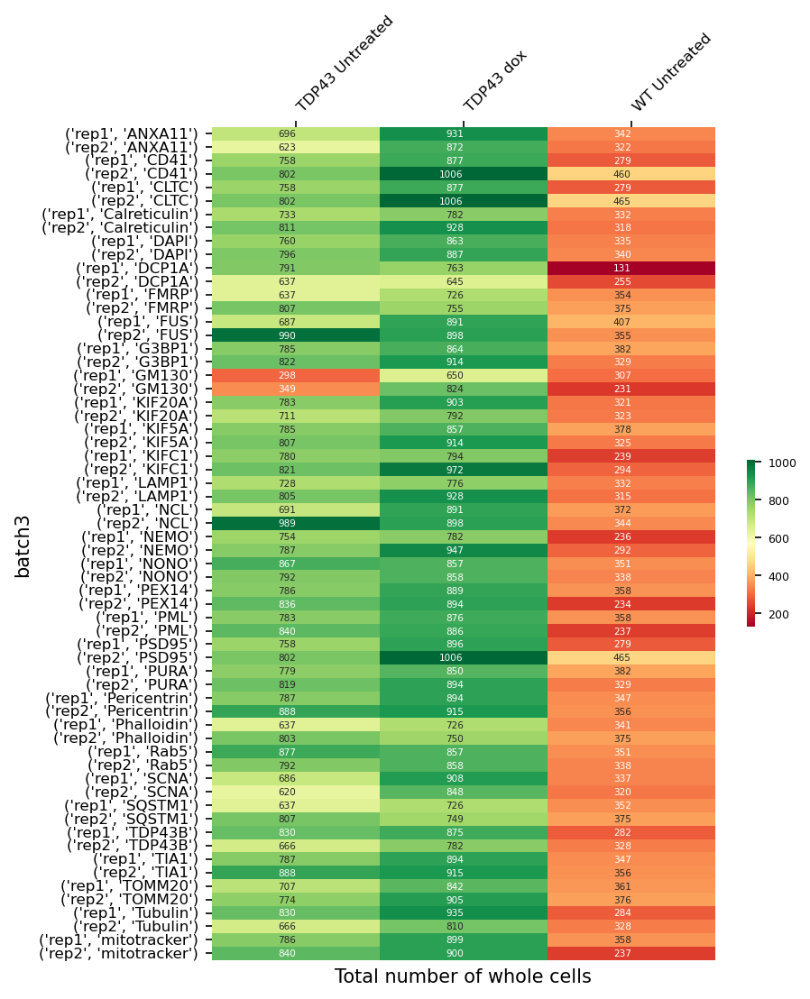

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


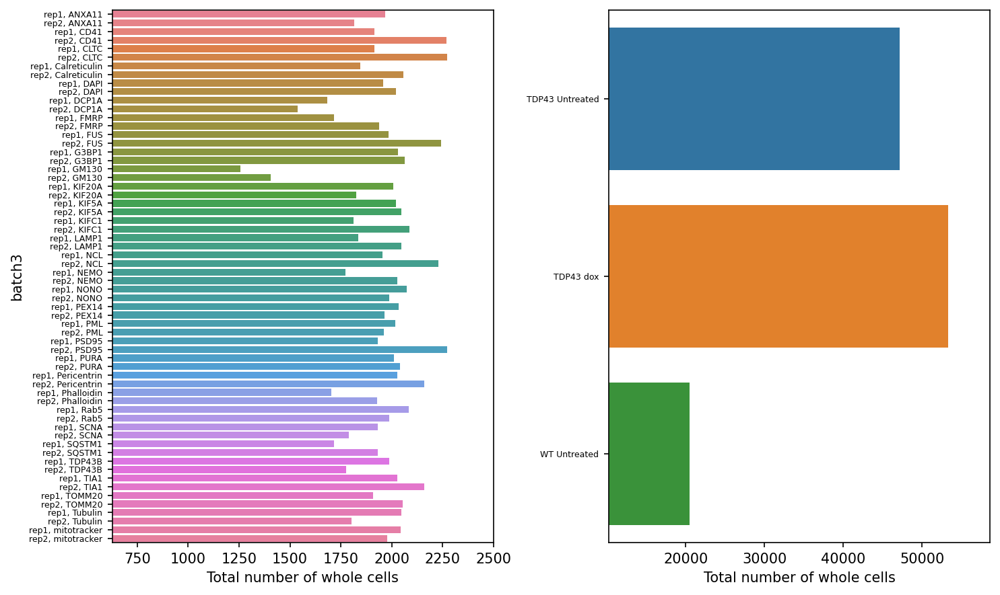

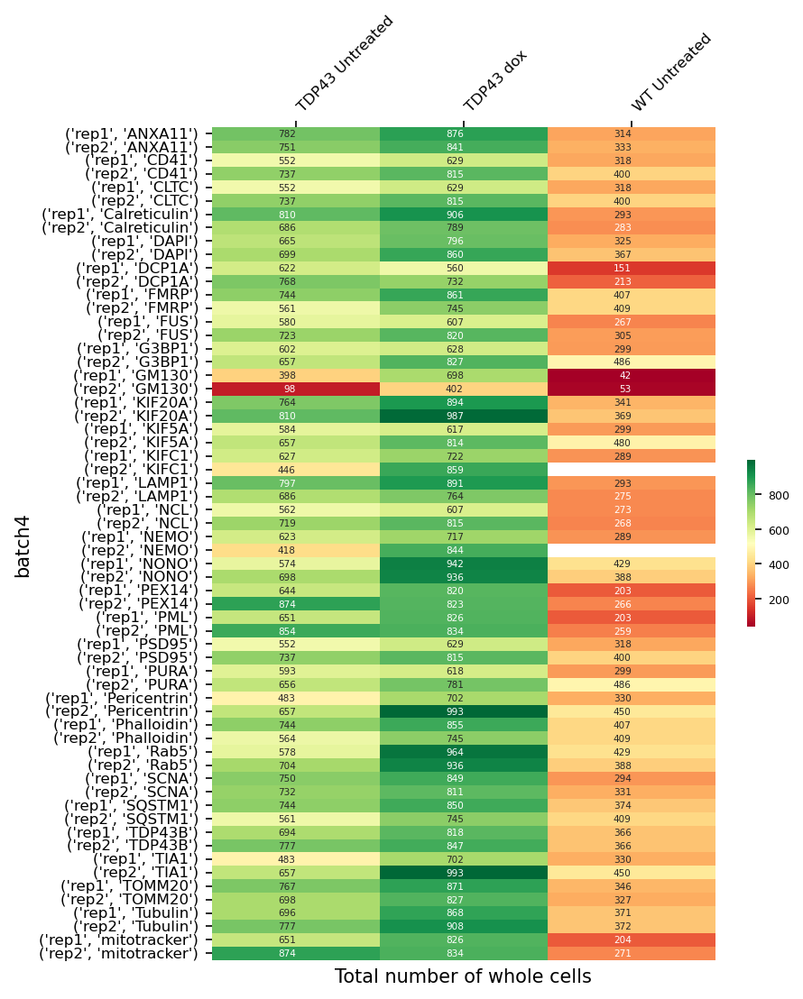

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


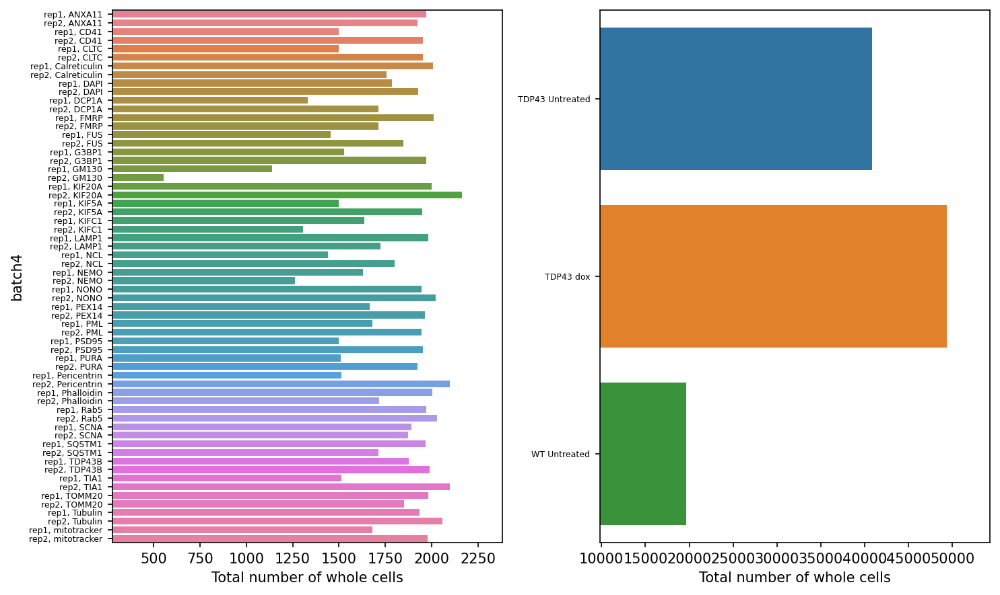

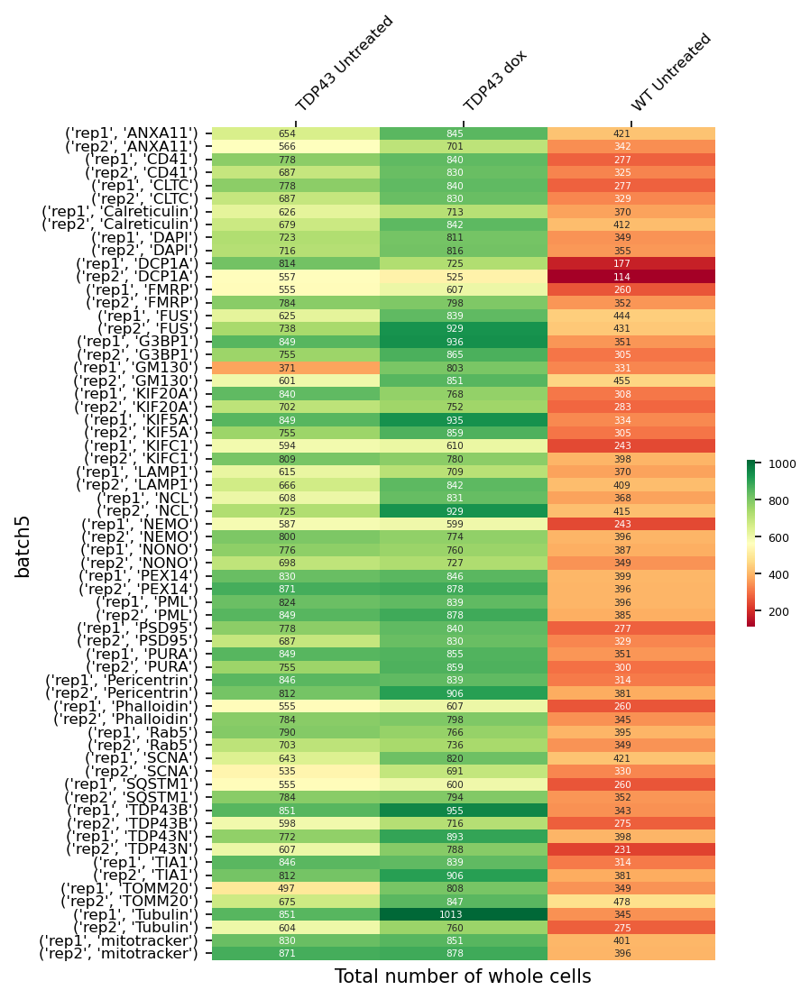

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:397: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  for batch in batches:


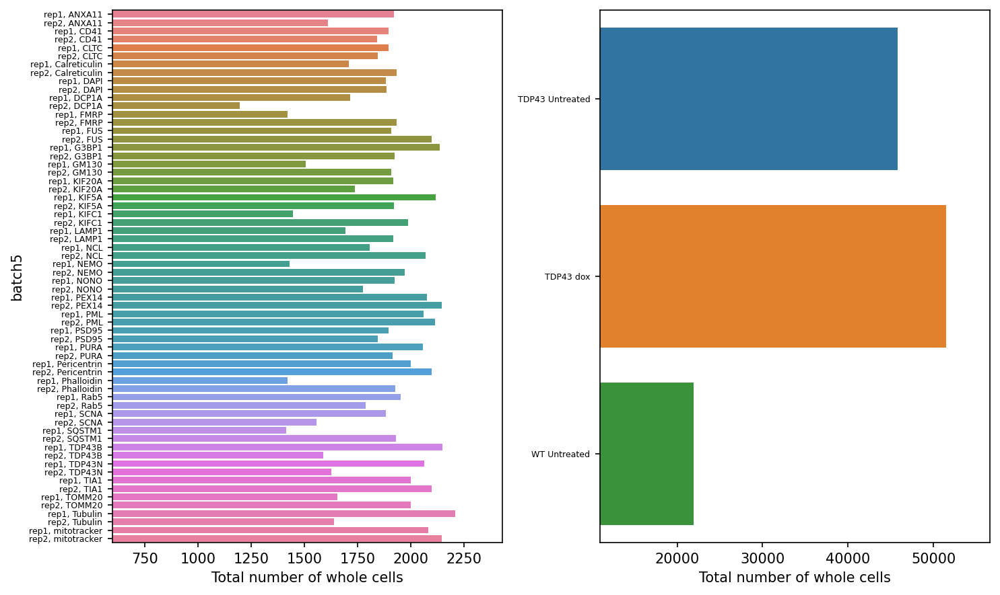

In [27]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(6,8))

### Show **Cell Count** Statistics per Batch

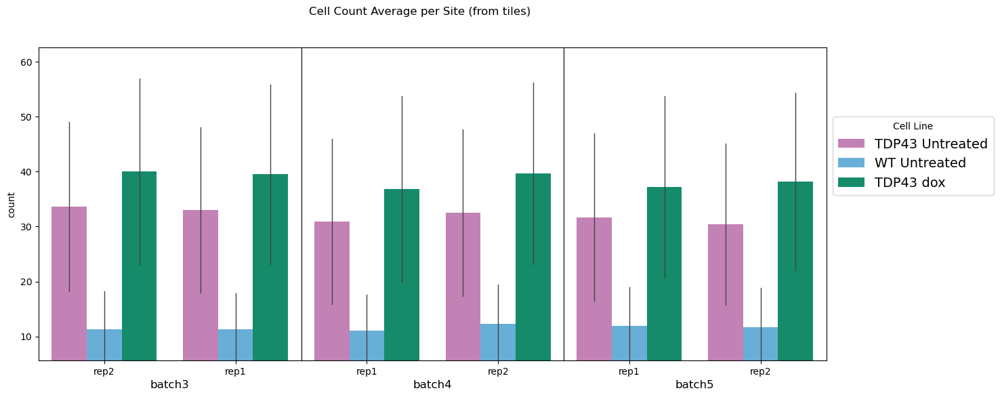

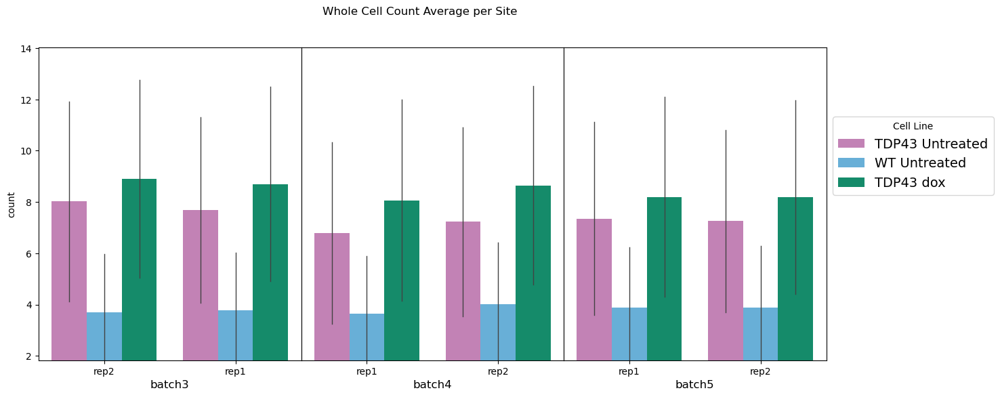

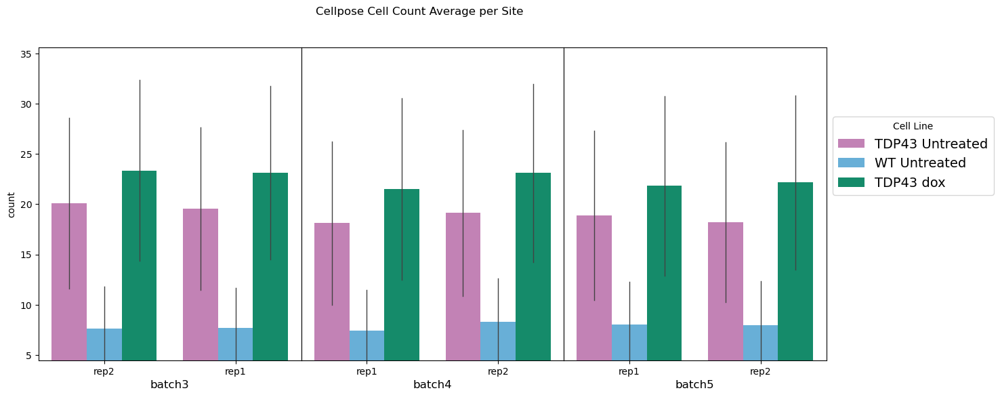

In [28]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles !=0]
plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site')


### Show **Tiles** per Site Statistics


In [29]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles.mean()

cell_line_cond
TDP43 Untreated    6.463026
TDP43 dox          7.486036
WT Untreated       3.277463
Name: n_valid_tiles, dtype: float64

In [6]:
df_dapi[['site_cell_count']].mean()

site_cell_count    16.276892
dtype: float64

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:1073: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hue_order=palette.keys()


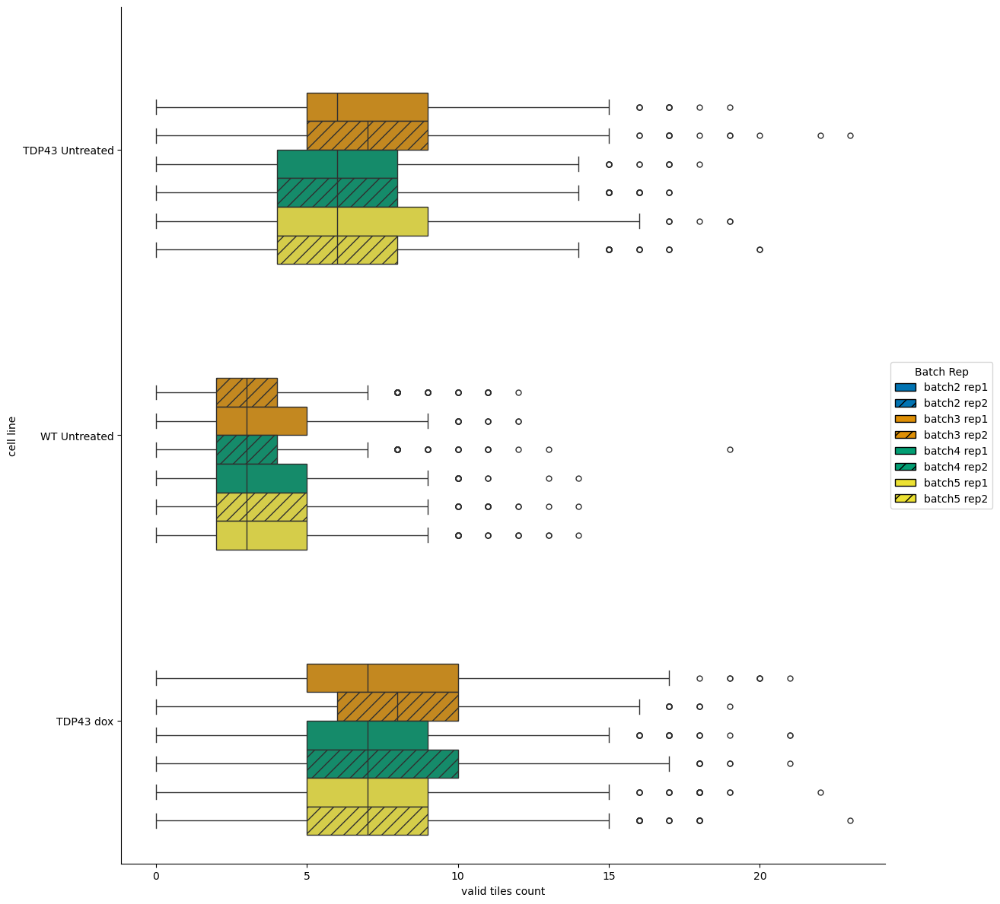

In [30]:
plot_catplot(df_dapi, custom_palette,reps, x='n_valid_tiles', x_title='valid tiles count', batch_min=2, batch_max=5)


### Show Mean of cell count in valid tiles

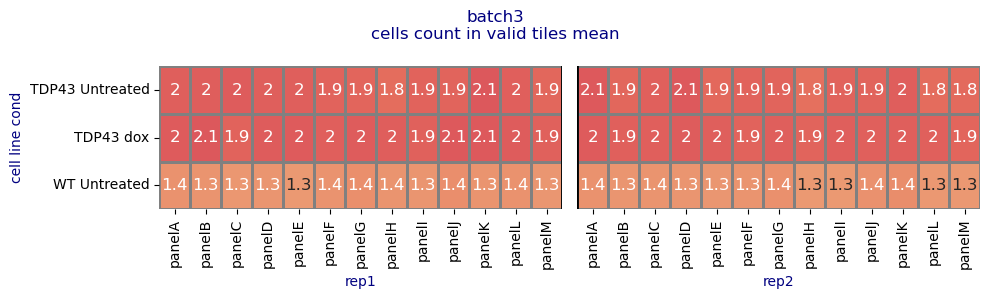

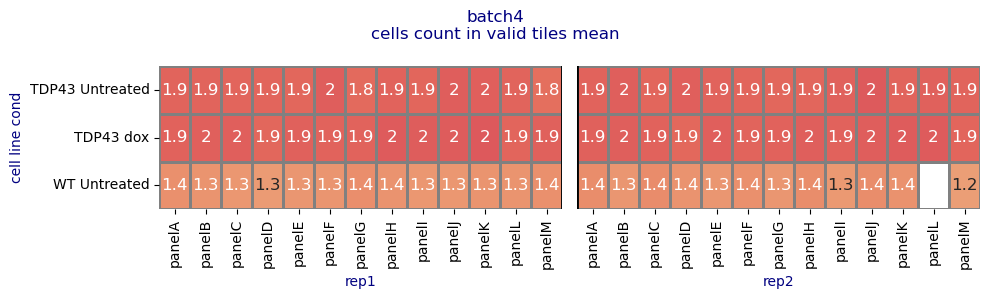

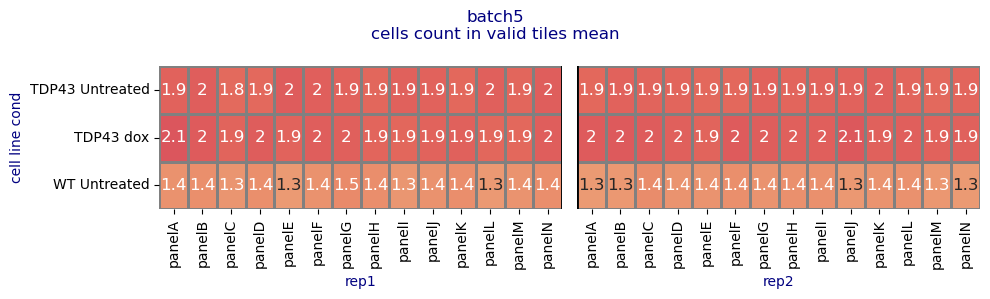

In [31]:
plot_hm(df_dapi, split_by='rep', rows='cell_line_cond', columns='panel', figsize=(10,3))


# Assessing Staining Reproducibility and Outliers

batch3


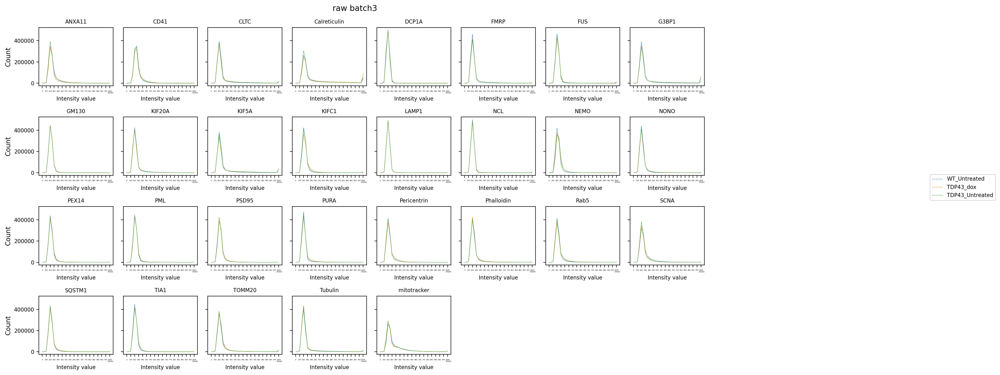

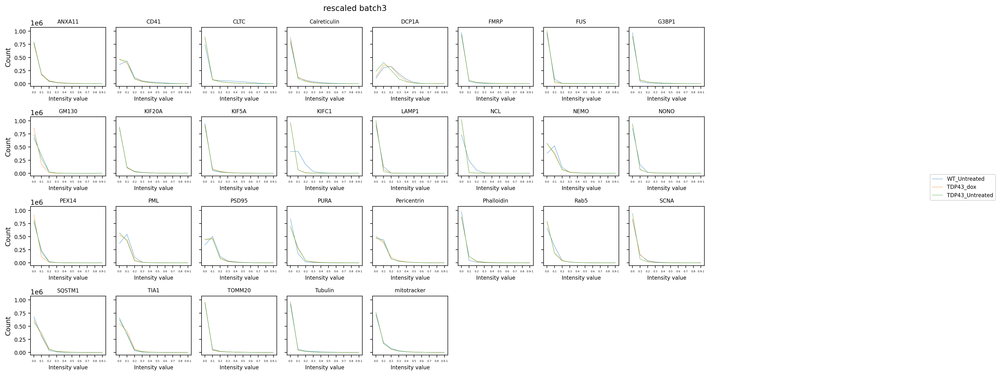

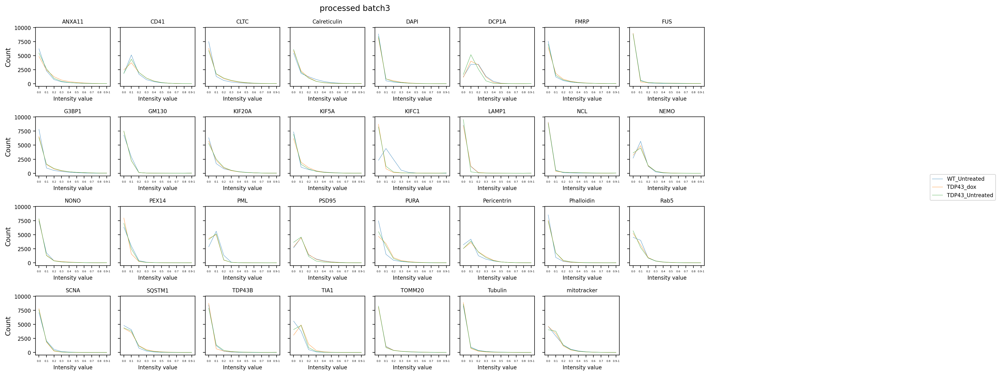

batch4


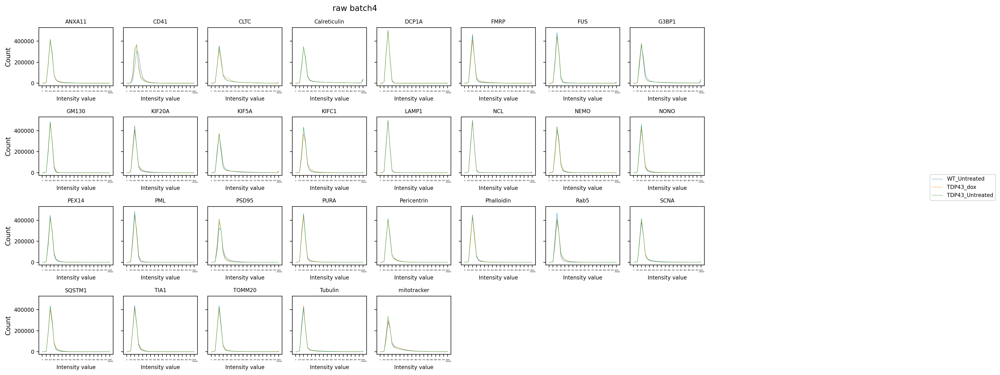

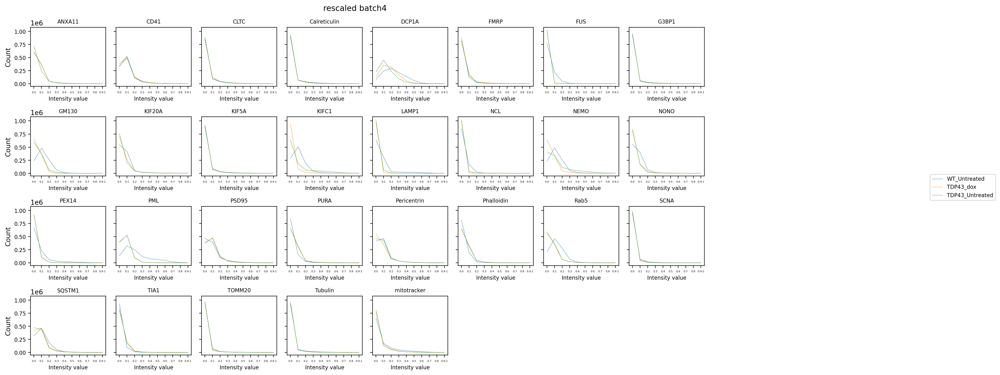

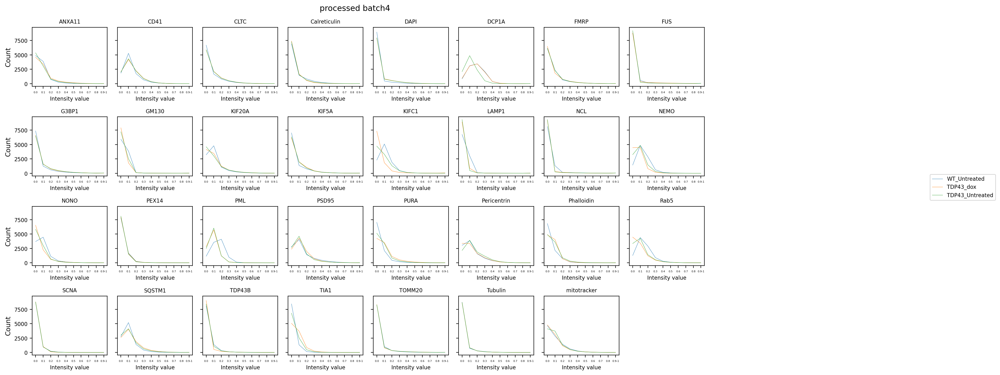

batch5


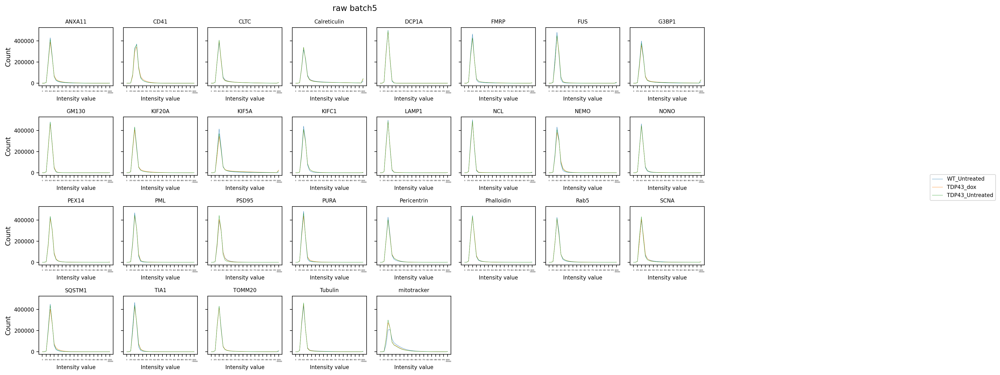

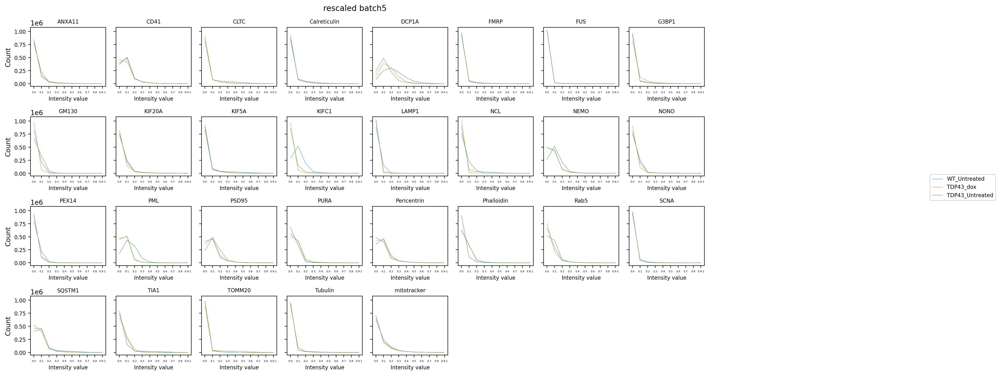

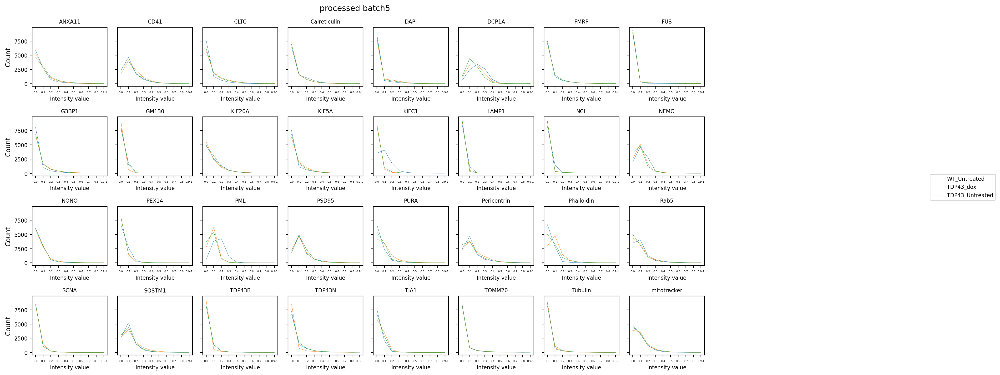

In [8]:
for batch in batches:
    print(batch)
    run_calc_hist_new(f'{batch}', dnls_cell_lines_for_disp, dnls_markers,
                      root_directory_raw, root_directory_proc,
                           hist_sample=10,sample_size_per_markers=200, ncols=8, nrows=4, dnls=True)
    print("="*30)

In [ ]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
from IPython.display import display, Javascript
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system(f'jupyter nbconvert --to html tools/preprocessing_tools/qc_reports/qc_report_dNLS.ipynb --output {NOVA_HOME}/manuscript/preprocessing_qc_reports/qc_report_dNLS.html')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook tools/preprocessing_tools/qc_reports/qc_report_dNLS.ipynb to html
[NbConvertApp] Writing 13040534 bytes to /home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/manuscript/preprocessing_qc_reports/qc_report_dNLS.html


0